<a href="https://colab.research.google.com/github/Lucy-wo/MMAICapstoneProject/blob/main/Capstone_Project_0811.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import re
import string
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS as stop_words
from nltk.stem import WordNetLemmatizer
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
from sklearn.model_selection import train_test_split, cross_val_score, RepeatedKFold, ShuffleSplit
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.pipeline import Pipeline
import openpyxl
from sklearn.multioutput import MultiOutputClassifier
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, GlobalAveragePooling1D, concatenate
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

warnings.filterwarnings('ignore')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# Step 1: Read Excel File

In [ ]:
file_path = 'SoF Q1-Q4 2018-2021 Comments - coded.xlsx'
excel_data = pd.ExcelFile(file_path)

# Define tabs to exclude
exclude_tabs = ['Master List Codes', 'Master Verbatim']

# Read the data from each tab except the excluded ones
data_frames = []
for sheet in excel_data.sheet_names:
    if sheet not in exclude_tabs:
        df = pd.read_excel(file_path, sheet_name=sheet)
        # Rename column C to 'Comment'
        if len(df.columns) > 2:
            df.rename(columns={df.columns[2]: 'Comment'}, inplace=True)
        # Keep only the required columns if they exist - Broad Code 1' and 'Sub Code 1'
        cols = df.columns
        if 'Comment' in cols and 'Broad Code 1' in cols and 'Sub Code 1' in cols:
            df = df[['Comment', 'Broad Code 1', 'Sub Code 1']]
            # Keep the sheet name to the input data
            df['tab name'] = sheet
            data_frames.append(df)

# Concatenate all data frames into one
result_df = pd.concat(data_frames, ignore_index=True)
result_df = result_df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1']]

# Step 2: Text/Data Cleansing

In [ ]:
# Only keep rows that have values in both 'Comment' and 'Broad Code 1' columns
df = result_df.dropna(subset=['Comment', 'Broad Code 1'])

# Step 2: Data cleaning for the 'Comment' column
lemmatizer = WordNetLemmatizer()
def clean_comment(comment):
    # Remove HTML tags
    comment = BeautifulSoup(comment, "html.parser").get_text()
    # Case standardization
    comment = comment.lower()
    # Remove URLs
    comment = re.sub(r'http\S+|www\S+|https\S+', '', comment, flags=re.MULTILINE)
    # Remove special characters, mentions, hashtags, and digits
    comment = re.sub(r'\@\w+|\#|\d+', '', comment)
    # Remove punctuation
    comment = comment.translate(str.maketrans('', '', string.punctuation))
    # Tokenize and lemmatize
    comment = comment.split()
    comment = [lemmatizer.lemmatize(word) for word in comment if word not in stop_words]
    # Join the cleaned words back into a single string
    comment = ' '.join(comment)
    return comment

df['Comment'] = df['Comment'].apply(clean_comment)
df.head()

,tab name,Comment,Broad Code 1,Sub Code 1
0,Client Services,blessed strong ays support heather wonderful h...,4.0,422.0
11,Client Services,human error take place feel like transaction m...,4.0,442.0
12,Client Services,ays amazing head office processing inaccurate ...,4.0,422.0
16,Client Services,accountability whatsoever contact centre frust...,17.0,1700.0
19,Client Services,weekend wait time help desk poor tech availabl...,5.0,503.0


In [ ]:
# Export the result_df to an Excel file
output_file_path = 'cleaned_df.xlsx'
df.to_excel(output_file_path, index=False)

# Step 3: EDA

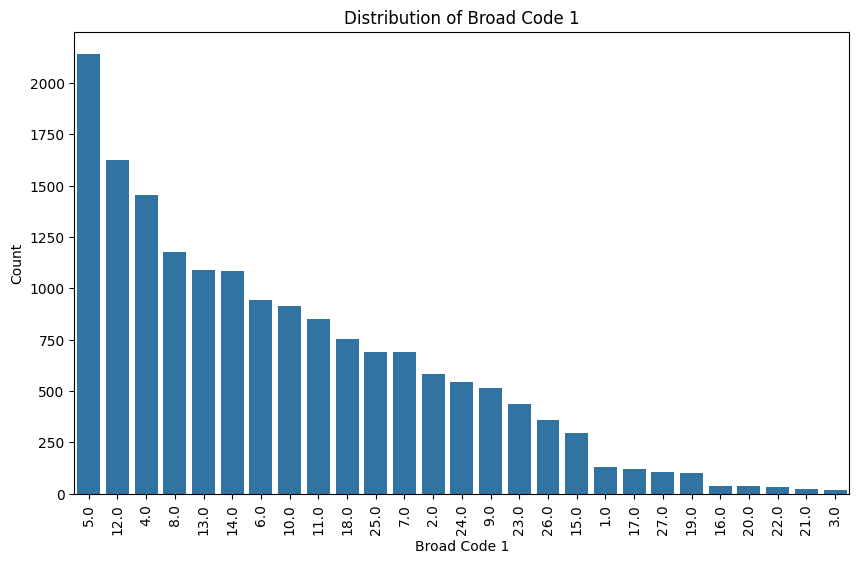

In [ ]:
# Distribution of Broad Code 1
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Broad Code 1', order=df['Broad Code 1'].value_counts().index)
plt.title('Distribution of Broad Code 1')
plt.xlabel('Broad Code 1')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

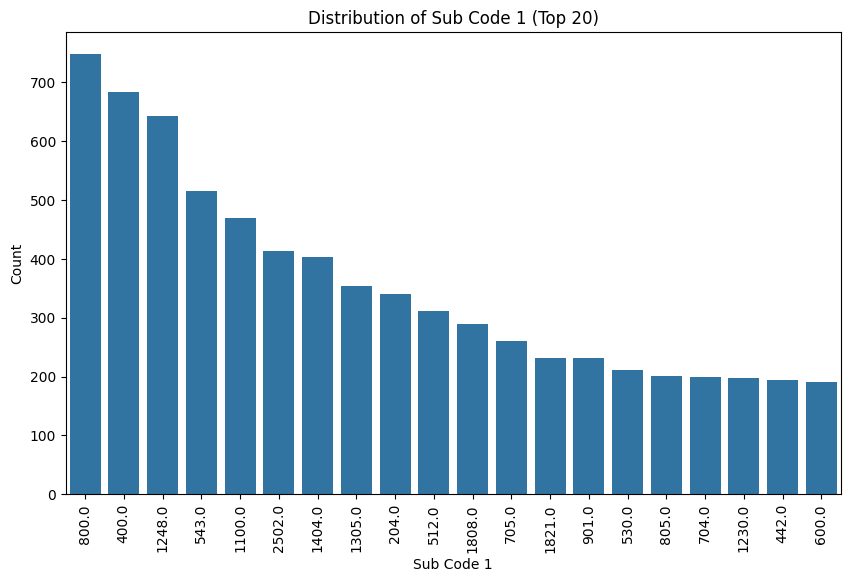

In [ ]:
# Distribution of Sub Code 1 (Top 20)
top_20_sub_code_1 = df['Sub Code 1'].value_counts().nlargest(20).index
plt.figure(figsize=(10, 6))
sns.countplot(data=df[df['Sub Code 1'].isin(top_20_sub_code_1)], x='Sub Code 1', order=top_20_sub_code_1)
plt.title('Distribution of Sub Code 1 (Top 20)')
plt.xlabel('Sub Code 1')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

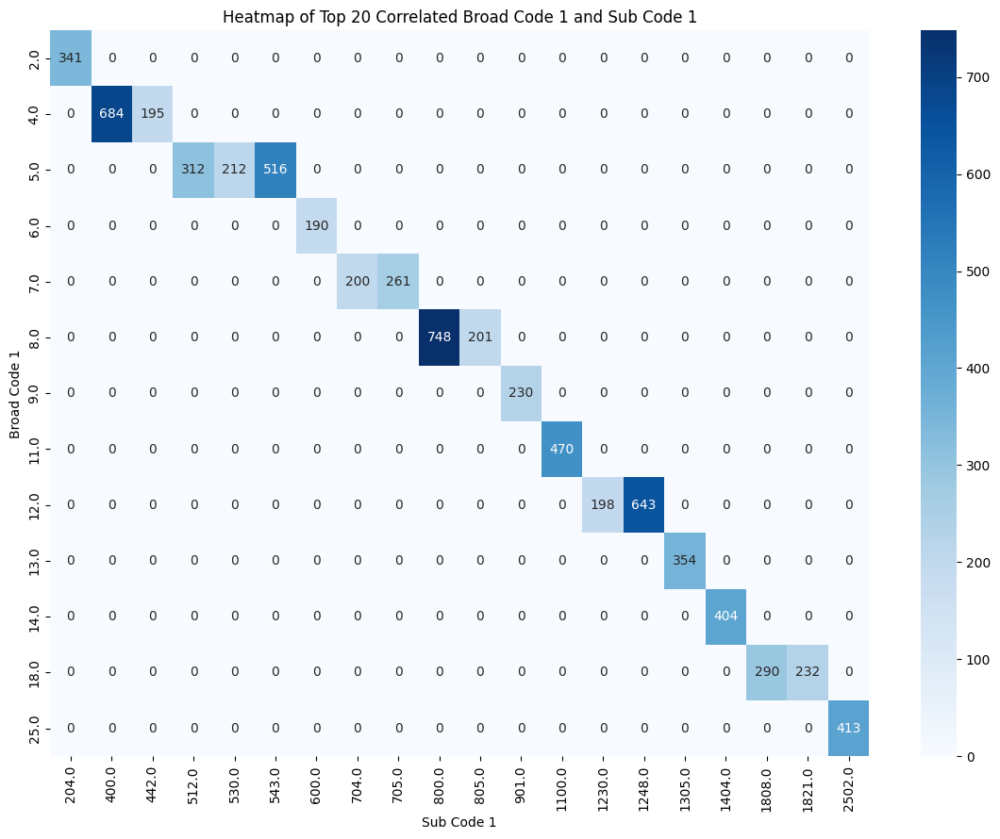

In [ ]:
# Relationship between Broad Code 1 and Sub Code 1 (Top 20 Correlated)
crosstab = pd.crosstab(df['Broad Code 1'], df['Sub Code 1'])
crosstab_flat = crosstab.unstack().reset_index()
crosstab_flat.columns = ['Sub Code 1', 'Broad Code 1', 'count']
top_20_pairs = crosstab_flat.nlargest(20, 'count')

# Pivot the top 20 pairs back to a matrix form for the heatmap
top_20_crosstab = top_20_pairs.pivot(index='Broad Code 1', columns='Sub Code 1', values='count').fillna(0)

plt.figure(figsize=(14, 10))
sns.heatmap(top_20_crosstab, cmap='Blues', annot=True, fmt='g')  # Use 'g' for general format to handle floats
plt.title('Heatmap of Top 20 Correlated Broad Code 1 and Sub Code 1')
plt.xlabel('Sub Code 1')
plt.ylabel('Broad Code 1')
plt.show()

In [ ]:
# Function to get top words
def get_top_words(text, n=10):
    words = ' '.join(text).split()
    word_counts = Counter(words)
    return word_counts.most_common(n)

# Get top words for Broad Code 1
broad_code_1_top_words = df.groupby('Broad Code 1')['Comment'].apply(lambda x: get_top_words(x))

# Get top words for Sub Code 1
sub_code_1_top_words = df.groupby('Sub Code 1')['Comment'].apply(lambda x: get_top_words(x))

# Display top words for Broad Code 1
for broad_code, words in broad_code_1_top_words.items():
    print(f"Top words for Broad Code 1 - {broad_code}:")
    print(words)
    print("\n")

# Display top words for Sub Code 1
for sub_code, words in sub_code_1_top_words.items():
    print(f"Top words for Sub Code 1 - {sub_code}:")
    print(words)
    print("\n")

Top words for Broad Code 1 - 1.0:
[('client', 58), ('advertising', 51), ('marketing', 46), ('ig', 46), ('ad', 45), ('national', 43), ('need', 30), ('consultant', 24), ('like', 24), ('company', 23)]


Top words for Broad Code 1 - 2.0:
[('change', 442), ('client', 245), ('consultant', 208), ('ig', 206), ('time', 170), ('year', 149), ('company', 147), ('business', 103), ('new', 102), ('need', 98)]


Top words for Broad Code 1 - 3.0:
[('client', 37), ('ig', 23), ('product', 9), ('consultant', 8), ('need', 7), ('time', 6), ('lot', 6), ('service', 6), ('business', 6), ('better', 6)]


Top words for Broad Code 1 - 4.0:
[('client', 634), ('time', 488), ('service', 357), ('ays', 268), ('need', 250), ('issue', 247), ('answer', 242), ('consultant', 215), ('error', 214), ('processing', 177)]


Top words for Broad Code 1 - 5.0:
[('advantage', 579), ('search', 577), ('time', 481), ('need', 463), ('client', 435), ('ig', 433), ('information', 420), ('technology', 362), ('plus', 318), ('work', 309)]




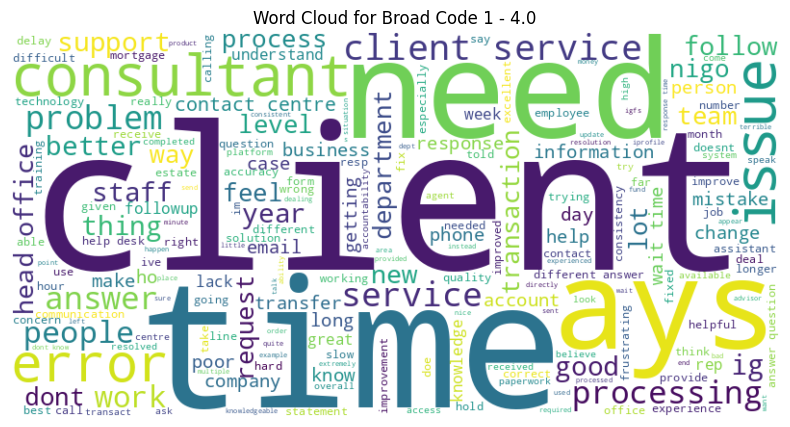

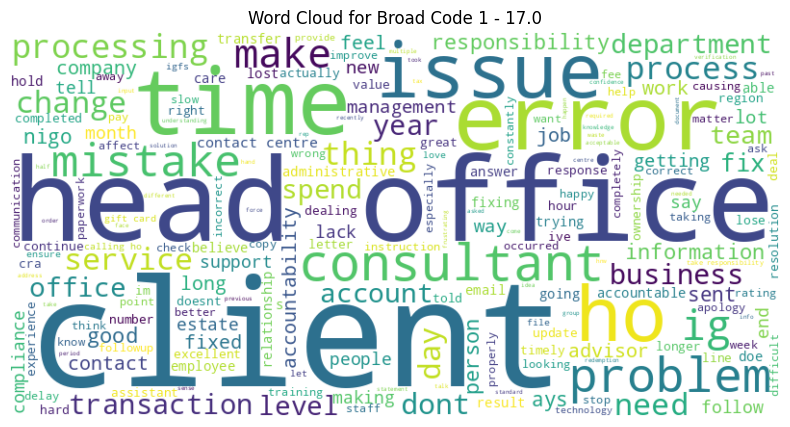

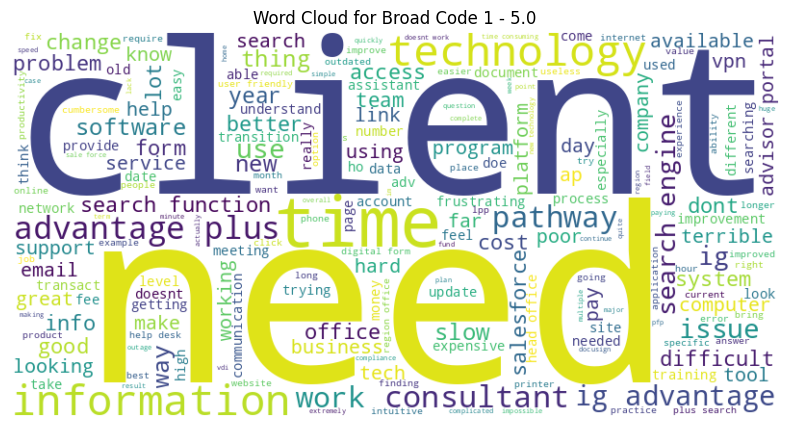

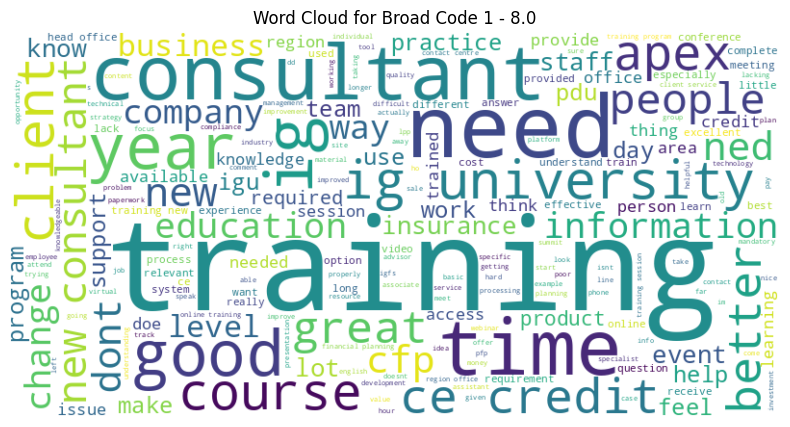

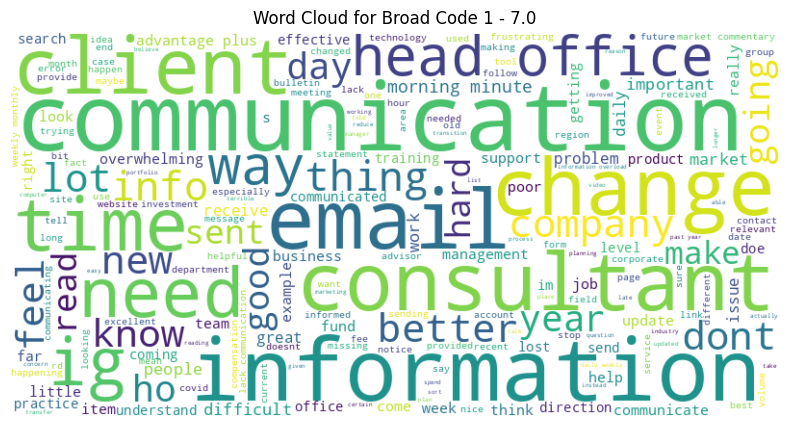

...

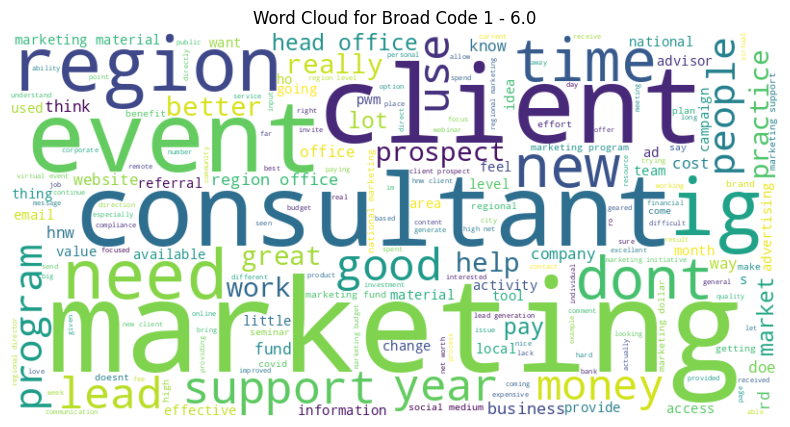

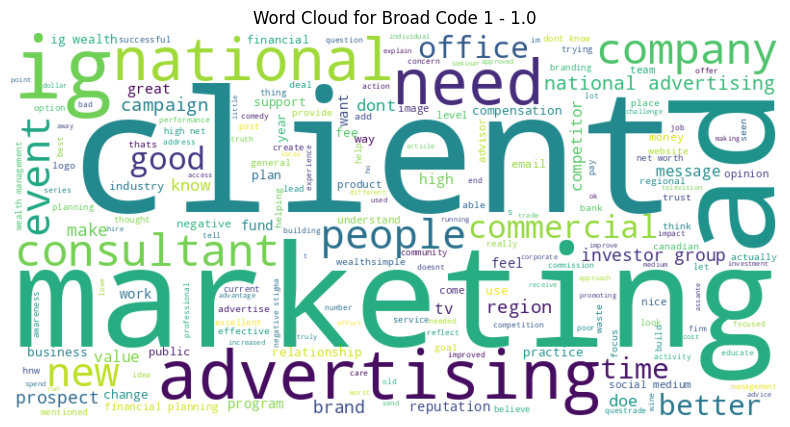

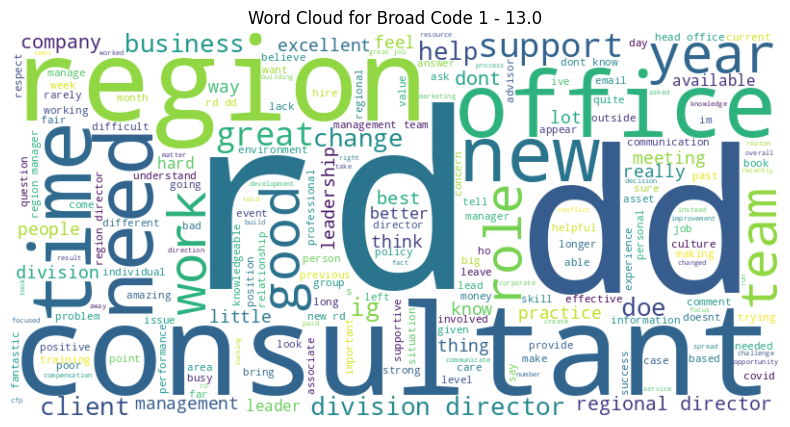

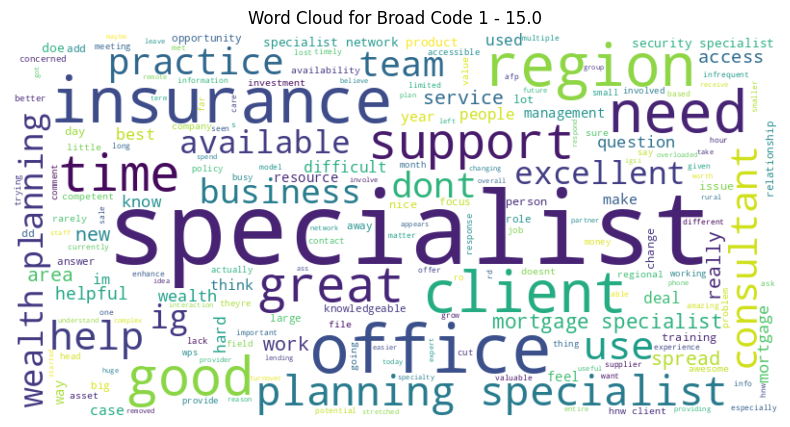

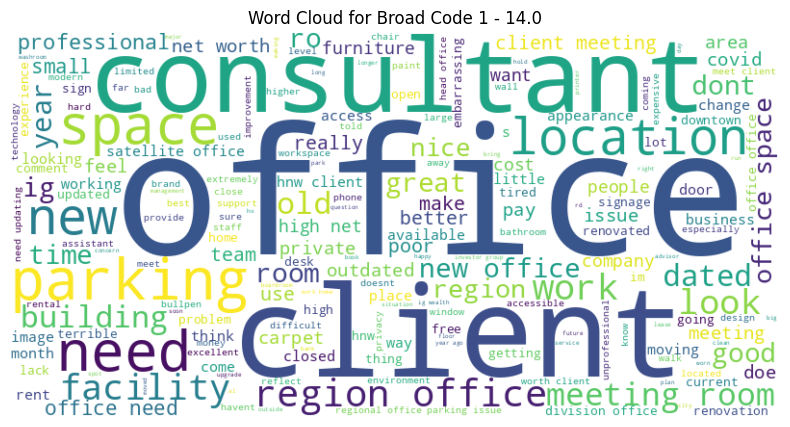

In [ ]:
# Generate word clouds for Broad Code 1
for broad_code in df['Broad Code 1'].unique():
    text = ' '.join(df[df['Broad Code 1'] == broad_code]['Comment'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Broad Code 1 - {broad_code}')
    plt.axis('off')
    plt.show()

# Step 4: Prepare Data for Model

In [ ]:
# Combine 'tab name' and 'Comment' into a single feature
df['text'] = df['tab name'] + ' ' + df['Comment']

# Split the data into features and target
X = df['text']
y_broad_code = df['Broad Code 1']
y_sub_code = df['Sub Code 1']

#Tokenization by using BOW - TF-IDF
tfidf_vectorizer = TfidfVectorizer(
    # ignore terms that appear in less than 1% of the documents".
    min_df=.01,
    # ignore terms that appear in more than 95% of the documents
    max_df=.95,
    ngram_range=(1,5))
%time dtm_tfidf = tfidf_vectorizer.fit_transform(X)

bow_df_tfidf = pd.DataFrame(dtm_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out(), index=X.index)

vectorizer_cleaned_df = pd.concat([y_broad_code, y_sub_code, X, bow_df_tfidf], axis=1)
vectorizer_cleaned_df.drop(columns=['text'], inplace=True)
print(vectorizer_cleaned_df.shape)
vectorizer_cleaned_df.head()


CPU times: user 2.54 s, sys: 62.3 ms, total: 2.6 s
Wall time: 2.61 s
(16771, 297)


,Broad Code 1,Sub Code 1,ability,able,access,account,actually,admin,advantage,advantage plus,...,value,wait,want,way,wealth,week,work,working,worth,year
0,4.0,422.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0
11,4.0,442.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0
12,4.0,422.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.2422,0.162336,0.0,0.0,0.0
16,17.0,1700.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0
19,5.0,503.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.305564,0.0,0.0,0.0,0.0000,0.000000,0.0,0.0,0.0


In [ ]:
# Export the result_df to an Excel file
output_file_path = 'vectorizer_cleaned_df.xlsx'
vectorizer_cleaned_df.to_excel(output_file_path, index=False)

# Step 5: Shallow ML Models - Multi Label Classifcation

In [ ]:
# Split the data into features and target
X = vectorizer_cleaned_df.drop(columns=['Broad Code 1', 'Sub Code 1'])
y = vectorizer_cleaned_df[['Broad Code 1', 'Sub Code 1']]

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
# Define the parameter grid for each model
param_grid = {
    'RandomForest': {
        'classifier__estimator__n_estimators': [50, 100, 200],
        'classifier__estimator__max_depth': [None, 10, 20],
    },
    'LogisticRegression': {
        'classifier__estimator__C': [0.1, 1, 10],
        'classifier__estimator__solver': ['liblinear', 'lbfgs'],
    },
    'KNeighbors': {
        'classifier__estimator__n_neighbors': [3, 5, 7],
        'classifier__estimator__weights': ['uniform', 'distance'],
    }
}

# Define the models
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000, random_state=42),
    'KNeighbors': KNeighborsClassifier()

}

# Function to perform GridSearchCV and evaluate a model
def grid_search_and_evaluate_with_roc_auc(model_name, model, param_grid):
    pipeline = Pipeline([
        ('classifier', MultiOutputClassifier(model))
    ])

    grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=2, scoring='f1')
    grid_search.fit(X_train, y_train)

    best_pipeline = grid_search.best_estimator_

    # Make predictions on the validation data
    y_pred = best_pipeline.predict(X_val)
    y_pred_proba = best_pipeline.predict_proba(X_val)

    # Evaluate the model
    print(f"Model: {model_name}")
    print(f"Best parameters: {grid_search.best_params_}")

    print(f"Evaluation for Broad Code 1 with {model_name}:")
    print(f"Accuracy: {accuracy_score(y_val['Broad Code 1'], y_pred[:, 0])}")
    f1 = f1_score(y_val['Broad Code 1'], y_pred[:, 0], average='weighted')
    print(f'F1 Score for {model_name}: {f1}')
    print("\n")

    print(f"Evaluation for Sub Code 1 with {model_name}:")
    print(f"Accuracy: {accuracy_score(y_val['Sub Code 1'], y_pred[:, 1])}")
    f1 = f1_score(y_val['Sub Code 1'], y_pred[:, 1], average='weighted')
    print(f'F1 Score for {model_name}: {f1}')
    print("\n")

    # Calculate ROC AUC for Broad Code 1
    try:
        auc_broad_code_1 = roc_auc_score(y_val['Broad Code 1'], y_pred_proba[0][:, 1], average='weighted', multi_class='ovr')
        print(f"ROC AUC for Broad Code 1: {auc_broad_code_1}")
    except ValueError:
        print("ROC AUC for Broad Code 1 could not be calculated due to lack of positive class in y_true")

    # Calculate ROC AUC for Sub Code 1
    try:
        auc_sub_code_1 = roc_auc_score(y_val['Sub Code 1'], y_pred_proba[1][:, 1], average='weighted', multi_class='ovr')
        print(f"ROC AUC for Sub Code 1: {auc_sub_code_1}")
    except ValueError:
        print("ROC AUC for Sub Code 1 could not be calculated due to lack of positive class in y_true")

    print("\n")


    return best_pipeline

In [ ]:
# Apply grid search, evaluate each model, and calculate ROC AUC
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")
    grid_search_and_evaluate_with_roc_auc(model_name, model, param_grid[model_name])

Evaluating model: RandomForest
Model: RandomForest
Best parameters: {'classifier__estimator__max_depth': None, 'classifier__estimator__n_estimators': 50}
Evaluation for Broad Code 1 with RandomForest:
Accuracy: 0.8519475357710652
F1 Score for RandomForest: 0.8396592447712321


Evaluation for Sub Code 1 with RandomForest:
Accuracy: 0.4183227344992051
F1 Score for RandomForest: 0.36245513624681347


ROC AUC for Broad Code 1 could not be calculated due to lack of positive class in y_true
ROC AUC for Sub Code 1 could not be calculated due to lack of positive class in y_true


Evaluating model: LogisticRegression
Model: LogisticRegression
Best parameters: {'classifier__estimator__C': 0.1, 'classifier__estimator__solver': 'liblinear'}
Evaluation for Broad Code 1 with LogisticRegression:
Accuracy: 0.8430047694753577
F1 Score for LogisticRegression: 0.8240021604380399


Evaluation for Sub Code 1 with LogisticRegression:
Accuracy: 0.3521462639109698
F1 Score for LogisticRegression: 0.2229671745

# Focuse on the RandomForest to do hyperparameter tunning

In [ ]:
# Define a deeper parameter grid for RandomForest
param_grid_rf = {
    'classifier__estimator__n_estimators': [50, 100, 200],
    'classifier__estimator__max_depth': [None, 10, 20],
    'classifier__estimator__min_samples_split': [2, 5],
    'classifier__estimator__min_samples_leaf': [1, 2],
    'classifier__estimator__max_features': ['sqrt', 'log2']
}

# Define the RandomForest model
model_rf = RandomForestClassifier(random_state=42)

# Function to perform GridSearchCV and evaluate the RandomForest model
def grid_search_and_evaluate_rf(param_grid):
    pipeline = Pipeline([
        ('classifier', MultiOutputClassifier(model_rf))
    ])

    grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=2, scoring='f1_weighted')
    grid_search.fit(X_train, y_train)

    best_pipeline = grid_search.best_estimator_

    # Make predictions on the validation data
    y_pred = best_pipeline.predict(X_val)
    y_pred_proba = best_pipeline.predict_proba(X_val)

    # Evaluate the model
    print("Model: RandomForest")
    print(f"Best parameters: {grid_search.best_params_}")

    print("Evaluation for Broad Code 1 with RandomForest:")
    accuracy_broad_code_1 = accuracy_score(y_val['Broad Code 1'], y_pred[:, 0])
    f1_broad_code_1 = f1_score(y_val['Broad Code 1'], y_pred[:, 0], average='weighted')
    print(f"Accuracy: {accuracy_broad_code_1}")
    print(f'F1 Score: {f1_broad_code_1}')
    print("\n")

    print("Evaluation for Sub Code 1 with RandomForest:")
    accuracy_sub_code_1 = accuracy_score(y_val['Sub Code 1'], y_pred[:, 1])
    f1_sub_code_1 = f1_score(y_val['Sub Code 1'], y_pred[:, 1], average='weighted')
    print(f"Accuracy: {accuracy_sub_code_1}")
    print(f'F1 Score: {f1_sub_code_1}')
    print("\n")

    return best_pipeline

In [ ]:
# Apply grid search and evaluate the RandomForest model
best_rf_pipeline = grid_search_and_evaluate_rf(param_grid_rf)

Model: RandomForest
Best parameters: {'classifier__estimator__max_depth': None, 'classifier__estimator__max_features': 'sqrt', 'classifier__estimator__min_samples_leaf': 1, 'classifier__estimator__min_samples_split': 2, 'classifier__estimator__n_estimators': 50}
Evaluation for Broad Code 1 with RandomForest:
Accuracy: 0.8519475357710652
F1 Score: 0.8396592447712321


Evaluation for Sub Code 1 with RandomForest:
Accuracy: 0.4183227344992051
F1 Score: 0.36245513624681347




In [ ]:
# Define the final pipeline with the best parameters
final_pipeline = Pipeline([
    ('classifier', MultiOutputClassifier(RandomForestClassifier(
        max_depth=None,
        n_estimators=50,
        random_state=42,
        max_features='sqrt',
        min_samples_leaf=1,
        min_samples_split=2
    )))
])

# Train the selected model on the entire dataset
final_pipeline.fit(X, y)


# Make predictions on the entire dataset
predictions = final_pipeline.predict(X)
df['Predicted Broad Code 1'] = predictions[:, 0]
df['Predicted Sub Code 1'] = predictions[:, 1]

In [ ]:
output_file_path = 'predicted_traditional_output.xlsx'
df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1', 'Predicted Broad Code 1', 'Predicted Sub Code 1']].to_excel(output_file_path, index=False)
print(f"The DataFrame has been exported to {output_file_path}")

The DataFrame has been exported to predicted_traditional_output.xlsx


# Step 6: Deep Learning - Multi Label Classifcation

In [ ]:
file_path = 'cleaned_df.xlsx'
cleaned_df = pd.ExcelFile(file_path)
data_frames = []

for sheet in cleaned_df.sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)
    data_frames.append(df)

cleaned_df = pd.concat(data_frames, ignore_index=True)
cleaned_df['text'] = cleaned_df['tab name'].fillna('') + ' ' + cleaned_df['Comment'].fillna('')

# Split the data into features and targets
X = cleaned_df['text'].values
y_broad = cleaned_df['Broad Code 1'].values
y_sub = cleaned_df['Sub Code 1'].values

In [ ]:
# Define the model
vocab_size = len(tokenizer.word_index) + 1
embedding_dim = 100

input_text = Input(shape=(X_padded.shape[1],))
embedding = Embedding(vocab_size, embedding_dim)(input_text)
x = GlobalAveragePooling1D()(embedding)

# Output layers
output_broad = Dense(len(np.unique(y_broad)), activation='softmax', name='broad_output')(x)
output_sub = Dense(len(np.unique(y_sub)), activation='softmax', name='sub_output')(x)

model = Model(inputs=input_text, outputs=[output_broad, output_sub])

# Compile the model with metrics for each output
model.compile(optimizer='adam',
              loss={'broad_output': 'sparse_categorical_crossentropy', 'sub_output': 'sparse_categorical_crossentropy'},
              metrics={'broad_output': 'accuracy', 'sub_output': 'accuracy'})

# Train the model
history = model.fit(
    X_train, {'broad_output': y_train_broad, 'sub_output': y_train_sub},
    epochs=10, batch_size=32, validation_data=(X_val, {'broad_output': y_val_broad, 'sub_output': y_val_sub})
)

Epoch 1/10
420/420 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - broad_output_accuracy: 0.1216 - loss: 8.2277 - sub_output_accuracy: 0.0356 - val_broad_output_accuracy: 0.1353 - val_loss: 7.8463 - val_sub_output_accuracy: 0.0382
Epoch 2/10
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - broad_output_accuracy: 0.1416 - loss: 7.8606 - sub_output_accuracy: 0.0427 - val_broad_output_accuracy: 0.1976 - val_loss: 7.7956 - val_sub_output_accuracy: 0.0441
Epoch 3/10
420/420 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - broad_output_accuracy: 0.1593 - loss: 7.7922 - sub_output_accuracy: 0.0492 - val_broad_output_accuracy: 0.1416 - val_loss: 7.7290 - val_sub_output_accuracy: 0.0611
Epoch 4/10
420/420 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - broad_output_accuracy: 0.1943 - loss: 7.7253 - sub_output_accuracy: 0.0635 - val_broad_output_accuracy: 0.1556 - val_loss: 7.5697 - val_sub_output_accuracy: 0.1037
Epoch 5/10
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - broad_output_accuracy: 0.2723 - loss: 7.5084 - sub_output_accuracy: 0.0885

In [ ]:
# Evaluate the model
y_broad_pred, y_sub_pred = model.predict(X_val)
y_broad_pred = np.argmax(y_broad_pred, axis=1)
y_sub_pred = np.argmax(y_sub_pred, axis=1)

print("Evaluation for Broad Code 1:")
print(f"Accuracy: {accuracy_score(y_val_broad, y_broad_pred)}")
f1 = f1_score(y_val_broad, y_broad_pred, average='weighted')
print(f'F1 Score for Deep Learning Model: {f1}')
print('\n')

print("Evaluation for Sub Code 1:")
print(f"Accuracy: {accuracy_score(y_val_sub, y_sub_pred)}")
f1 = f1_score(y_val_sub, y_sub_pred, average='weighted')
print(f'F1 Score for Deep Learning Model: {f1}')

105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Evaluation for Broad Code 1:
Accuracy: 0.7448584202682563
F1 Score for Deep Learning Model: 0.688576926421353


Evaluation for Sub Code 1:
Accuracy: 0.2599105812220566
F1 Score for Deep Learning Model: 0.13734065949603555


In [ ]:
# Make predictions on the entire dataset
y_broad_pred_all, y_sub_pred_all = model.predict(X_padded)
df['Predicted Broad Code 1'] = label_encoder_broad.inverse_transform(np.argmax(y_broad_pred_all, axis=1))
df['Predicted Sub Code 1'] = label_encoder_sub.inverse_transform(np.argmax(y_sub_pred_all, axis=1))

# Export the DataFrame to a new Excel file
output_file_path = 'predicted_deeplearning_output.xlsx'
df[['tab name', 'Comment', 'Broad Code 1', 'Sub Code 1', 'Predicted Broad Code 1', 'Predicted Sub Code 1']].to_excel(output_file_path, index=False)
print(f"The DataFrame has been exported to {output_file_path}")

525/525 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
The DataFrame has been exported to predicted_deeplearning_output.xlsx
